# TUTORIAL 2: Fourier Domain Adaptation
**Author** - [Vuong NGUYEN](https://github.com/XuanMinhVuongNGUYEN)

This tutorial introduces you to the basics of the [Augmentare](https://forge.deel.ai/Fair/augmentare) library to easily use the deployment of Machine Learning techniques to augment data in **PyTorch**. This tutorial mainly explores the core features of library, the predefined losses and the models. 

This tutorial assumes that your system has installed Pytorch and Augmentare properly.

This tutorial uses the highly popular Fourier Domain Adaptation **FDA** architecture. **Augmentare** provides a generalised implementation of **FDA**.

**Paper** - [FDA: Fourier Domain Adaptation for Semantic Segmentation by Yanchao Yang & Stefano Soatto.](https://arxiv.org/pdf/2004.05498.pdf)

In [1]:
try:
    import augmentare
    print(f"Existing Augmentare {augmentare.__version__} installation found")

except ImportError:
    import subprocess
    import sys

    subprocess.check_call([sys.executable, "-m", "pip", "install", "augmentare"])
    import augmentare

    print(f"Installed Augmentare {augmentare.__version__}")

/home/vuong.nguyen/vuong/augmentare/dev_augmentare/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Existing Augmentare 0.0.1 installation found


## IMPORTS

In [2]:
import numpy as np
import torch
from PIL import Image
import IPython.display as display
import matplotlib.pyplot as plt

# Augmentare Imports
import augmentare
from augmentare.methods.style_transfer import *

## DATA LOADING AND PREPROCESSING
This tutorial uses the content image from [GTA5](https://arxiv.org/pdf/1608.02192v1.pdf) and the style image from [CityScapes](https://www.cityscapes-dataset.com/dataset-overview/).

In [3]:
im_src = Image.open("demo_images/source.png").convert('RGB')
im_trg = Image.open("demo_images/target.png").convert('RGB')

#### Show the source image

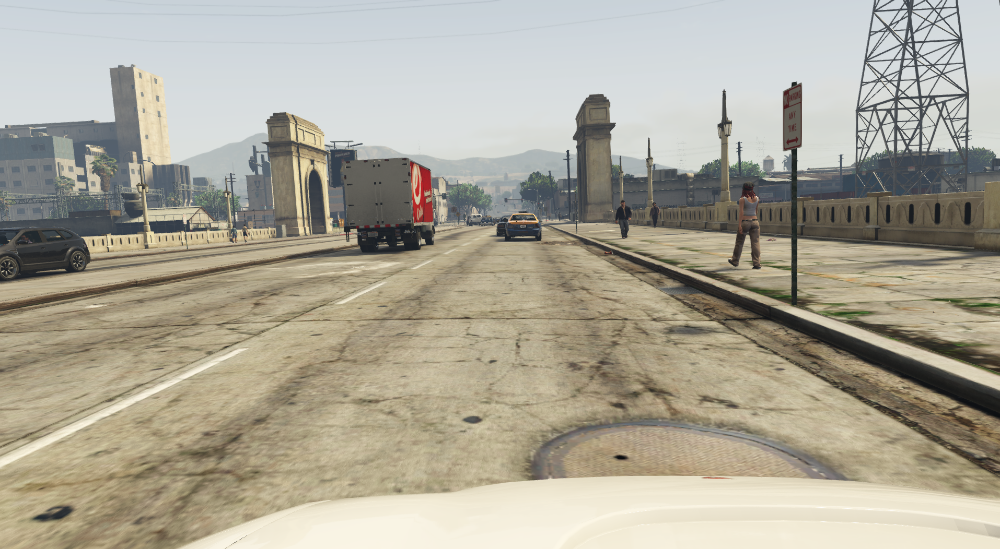

In [4]:
display.display(im_src)

#### Show the target image

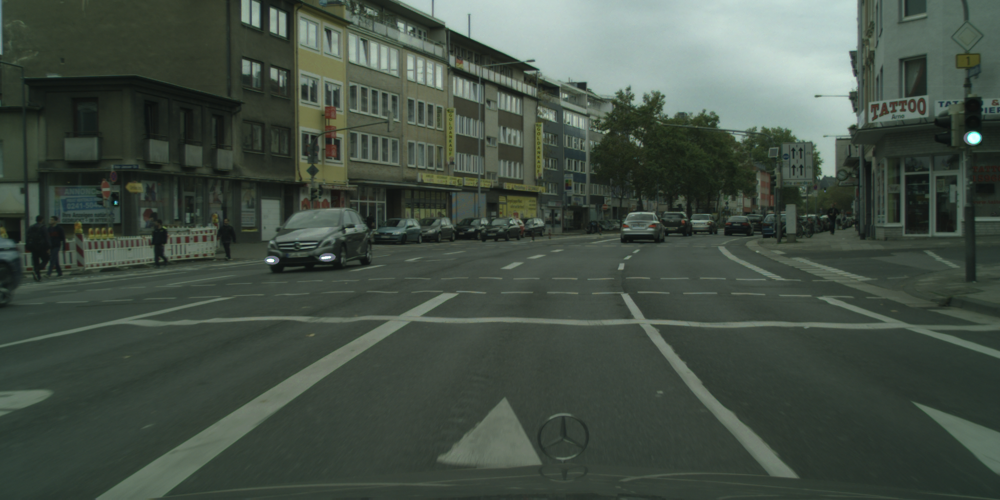

In [5]:
display.display(im_trg)

In [6]:
im_src = im_src.resize((1024,512), Image.Resampling.BICUBIC)
im_trg = im_trg.resize((1024,512), Image.Resampling.BICUBIC)

In [7]:
im_src = np.asarray(im_src, np.float32)
im_trg = np.asarray(im_trg, np.float32)

In [8]:
im_src = im_src.transpose((2, 0, 1))
im_trg = im_trg.transpose((2, 0, 1))

im_src = np.expand_dims(im_src, axis=0)
im_trg = np.expand_dims(im_trg, axis=0)

In [9]:
im_src = torch.from_numpy(im_src)
im_trg = torch.from_numpy(im_trg)

## NETWORK ARCHITECTURE : FDA

Simplified domain adaptation via style transfer thanks to the Fourier transformation. The FDA does not need deep networks for style transfer and adversarial training.

<img src="/home/vuong.nguyen/vuong/augmentare/tutorials/imgs/fda.png" alt="Picture" style="display: block; margin: 0 auto" />

The scheme of the proposed Fourier domain adaptation method:
    <ul> <li> <span style="color:gold"> Step 1: </span> <span> Apply FFT to source and target images. </span> </li>
    <li> <span style="color:gold"> Step 2: </span> <span> Replace the low frequency part of the source amplitude with that of the target. </span> </li>
    <li> <span style="color:gold"> Step 3: </span> <span> Apply the inverse FFT to the modified source spectrum. </span> </li> </ul>

**FDA**

Hyperparameters:

`source_img:` Source image

`target_img:` Target image

In [10]:
model = FDA(im_src, im_trg)

## VISUALIZE THE GENERATED DATA

**Styled images from the FDA**

A function that generates styled image by FDA.

Parameters:

`beta:` Controls the size of the low frequency window to be replaced

Returns:

`src_in_trg:` Output image was exchanged magnitude

### First approach

In [11]:
src_in_trg = model.fda_source_to_target(beta=0.01)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


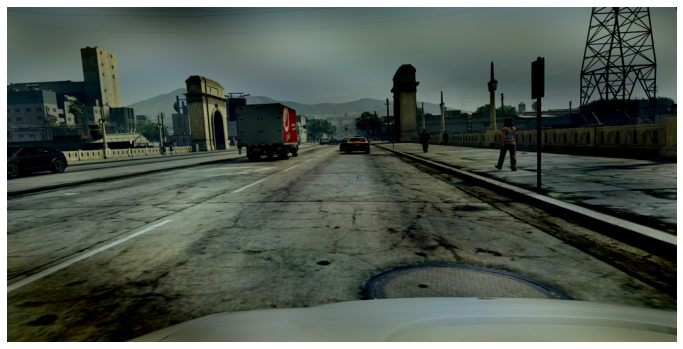

In [12]:
img = src_in_trg.squeeze(0).permute(1,2,0)
img = img.to('cpu').detach().numpy().copy()
img = img.real.astype(np.int32)

fig = plt.figure(figsize=(12,9))
plt.imshow(img)
plt.axis('off')
plt.show()

In [20]:
output = Image.open(f'gen_image_fda.png')

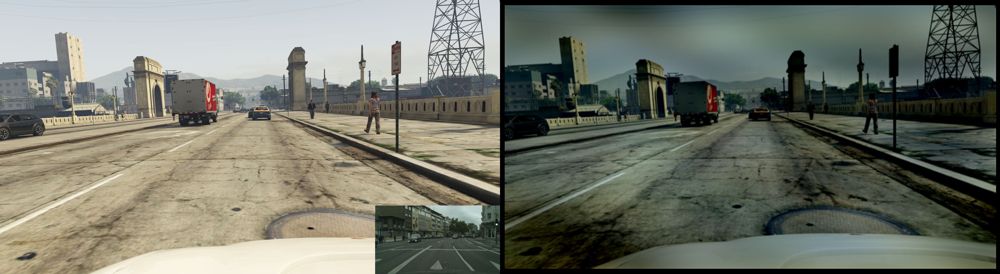

In [22]:
content_image = Image.open("demo_images/source.png").convert('RGB')
style_image = Image.open("demo_images/target.png").convert('RGB')

demo = Image.new('RGB', (content_image.width * 2, content_image.height))
output = output.resize(content_image.size)
style_image = style_image.resize((i // 4 for i in content_image.size))

demo.paste(content_image, (0, 0))
demo.paste(output, (content_image.width, 0))
demo.paste(style_image, (content_image.width - style_image.width, content_image.height - style_image.height))

display.display(demo)

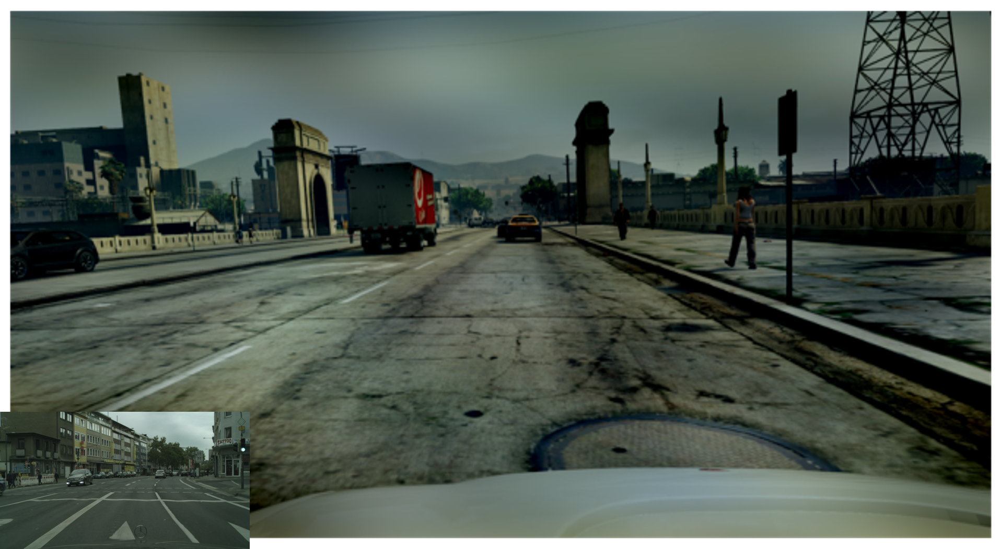

In [23]:
output.paste(style_image, (0, output.height - style_image.height))
display.display(output)

### Another approach with only real FFT

In [13]:
src_in_trg_2 = model.fda_source_to_target_2(beta=0.01)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


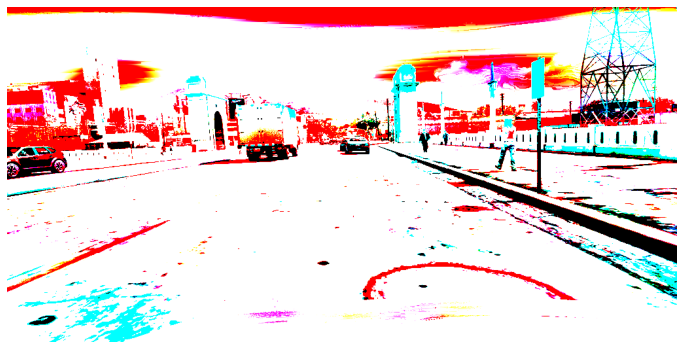

In [19]:
fig = plt.figure(figsize=(12,9))
img_2 = src_in_trg_2.squeeze(0).permute(1,2,0)
plt.imshow(img_2)
plt.axis('off')
plt.show()

In [24]:
output = Image.open(f'gen_image_fda_2.png')

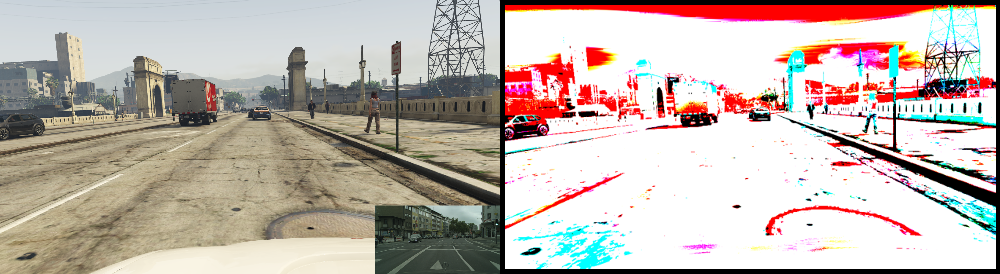

In [25]:
demo = Image.new('RGB', (content_image.width * 2, content_image.height))
output = output.resize(content_image.size)
style_image = style_image.resize((i // 4 for i in content_image.size))

demo.paste(content_image, (0, 0))
demo.paste(output, (content_image.width, 0))
demo.paste(style_image, (content_image.width - style_image.width, content_image.height - style_image.height))

display.display(demo)

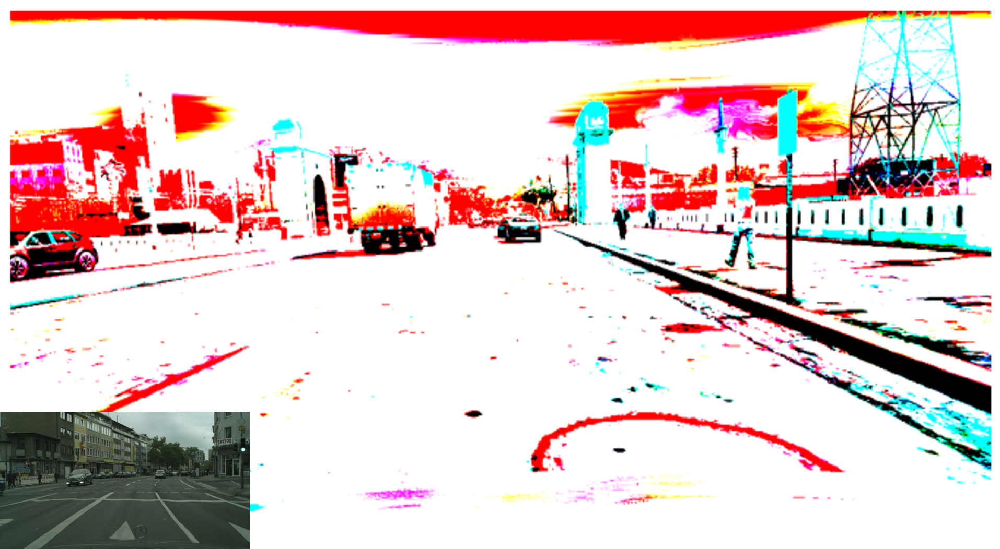

In [26]:
output.paste(style_image, (0, output.height - style_image.height))
display.display(output)